<a href="https://colab.research.google.com/github/MrDadzie/Income-Prediction-Project/blob/master/Starter_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# IMPORTANT

## Install latest version of packages to be used in the code

The latest version of libraries need to be installed as per competition rules and kindly adhere to that and install the updated version of libraries in the code.

## Please set random seed so that reproducible answers are attained

Wherever randomness is expected, do select the random seed so that the results are reproducible. Reproducibility of results is a **very important** component of model development without which reliable models are not attained.

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# #load data;
# from google.colab import files
# files.upload()

In [ ]:
!pip install -- catboost
!pip install termcolor
!pip install categorical_encoders


In [ ]:
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
from termcolor import colored
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn,preprocessing import StandardScaler
import categorical_encoders as ce
from catboost import CatBoostClassifier
from sklearn.metrics import f1_score,accuracy_score,classification_report
import warnings
#warnings.filterwarnings('always')
warnings.filterwarnings("ignore", category=DeprecationWarning)

## Loading test and train datasets

We will load the train and test datasets and do some basic level of EDA to understand the pattern of features in the data

* <b> Train data: </b> This is the data which we will be using to train the model. Since we are solving a classification problem, we will have a column in train dataset corresponding to the target labels.
* <b> Test data: </b> This is the data on which the predictions will be made based on the model trained on train dataset.



In [ ]:
#Loading Dataset
train_data = pd.read_csv('https://raw.githubusercontent.com/MrDadzie/Income-Prediction-Project/master/Datasets/Train.csv')
test_data = pd.read_csv('https://raw.githubusercontent.com/MrDadzie/Income-Prediction-Project/master/Datasets/Test.csv')

# Data Understanding


### Data Overview
The data contains 209499 rows and 14 columns (including the target/ output column (`income_above_limit`) ). The data type is a mix of categorical and numeric data. We notice that there are no null values.

In [ ]:
print(train_data.columns)
print('..............................')
print(test_data.columns)

Index(['ID', 'age', 'gender', 'education', 'class', 'education_institute',
       'marital_status', 'race', 'is_hispanic', 'employment_commitment',
       'unemployment_reason', 'employment_stat', 'wage_per_hour',
       'is_labor_union', 'working_week_per_year', 'industry_code',
       'industry_code_main', 'occupation_code', 'occupation_code_main',
       'total_employed', 'household_stat', 'household_summary',
       'under_18_family', 'veterans_admin_questionnaire', 'vet_benefit',
       'tax_status', 'gains', 'losses', 'stocks_status', 'citizenship',
       'mig_year', 'country_of_birth_own', 'country_of_birth_father',
       'country_of_birth_mother', 'migration_code_change_in_msa',
       'migration_prev_sunbelt', 'migration_code_move_within_reg',
       'migration_code_change_in_reg', 'residence_1_year_ago',
       'old_residence_reg', 'old_residence_state', 'importance_of_record',
       'income_above_limit'],
      dtype='object')
..............................
Index(['ID', '

In [ ]:
target_column_name = ['income_above_limit']
#The target column to be used for training
target_column      = train_data[target_column_name]

In [ ]:
train_data['education'].value_counts()

 High school graduate                      50627
 Children                                  49685
 Some college but no degree                29320
 Bachelors degree(BA AB BS)                20979
 7th and 8th grade                          8438
 10th grade                                 7905
 11th grade                                 7260
 Masters degree(MA MS MEng MEd MSW MBA)     6861
 9th grade                                  6540
 Associates degree-occup /vocational        5650
 Associates degree-academic program         4494
 5th or 6th grade                           3542
 12th grade no diploma                      2282
 1st 2nd 3rd or 4th grade                   1917
 Prof school degree (MD DDS DVM LLB JD)     1852
 Doctorate degree(PhD EdD)                  1318
 Less than 1st grade                         829
Name: education, dtype: int64

In [ ]:
train_data['marital_status'].value_counts()

 Never married                      90723
 Married-civilian spouse present    88407
 Divorced                           13456
 Widowed                            11029
 Separated                           3596
 Married-spouse absent               1568
 Married-A F spouse present           720
Name: marital_status, dtype: int64

## Data Processing

Here, the following is checked:

* Custom Error checking
* Missing Values and Methods of Dealing with them
* Checking for Class

### Custom Error Checking

The columns of interest include:

* Education
* Marital Status



In [ ]:
# Remove leading/trailing whitespace and then replace "?"
train_data['country_of_birth_own'] = train_data['country_of_birth_own'].str.strip()
train_data['country_of_birth_own'] = train_data['country_of_birth_own'].replace('?', 'US')

In [ ]:
#education column on the train set:
train_data['education'] = train_data['education'].str.strip()
train_data['education'] = train_data['education'].replace(['Less than 1st grade','Children', '1st 2nd 3rd or 4th grade','5th or 6th grade', '7th and 8th grade','9th grade', '10th grade','11th grade', '12th grade no diploma'], 'left' )
train_data['education'] = train_data['education'].replace('High school graduate', 'High School')
train_data['education'] = train_data['education'].replace(['Some college but no degree','Associates degree-academic program','Associates degree-occup /vocational'],'Associate Degree')
train_data['education'] = train_data['education'].replace('Bachelors degree(BA AB BS)', 'Undergrad')
train_data['education'] = train_data['education'].replace(['Masters degree(MA MS MEng MEd MSW MBA)', 'Prof school degree (MD DDS DVM LLB JD)'], 'Grad')
train_data['education'] = train_data['education'].replace('Masters degree(MA MS MEng MEd MSW MBA)', 'Grad')
train_data['education'] = train_data['education'].replace('Doctorate degree(PhD EdD)', 'Doctorate')
#teducation column on the test_data
test_data['education'] = test_data['education'].str.strip()
test_data['education'] = test_data['education'].replace(['Less than 1st grade','Children', '1st 2nd 3rd or 4th grade','5th or 6th grade', '7th and 8th grade','9th grade', '10th grade','11th grade', '12th grade no diploma'], 'left' )
test_data['education'] = test_data['education'].replace('High school graduate', 'High School')
test_data['education'] = test_data['education'].replace(['Some college but no degree','Associates degree-academic program','Associates degree-occup /vocational'],'Associate Degree')
test_data['education'] = test_data['education'].replace('Bachelors degree(BA AB BS)', 'Undergrad')
test_data['education'] = test_data['education'].replace(['Masters degree(MA MS MEng MEd MSW MBA)', 'Prof school degree (MD DDS DVM LLB JD)'], 'Grad')
test_data['education'] = test_data['education'].replace('Masters degree(MA MS MEng MEd MSW MBA)', 'Grad')
test_data['education'] = test_data['education'].replace('Doctorate degree(PhD EdD)', 'Doctorate')

In [ ]:
train_data['marital_status'] = train_data['marital_status'].str.strip()
train_data['marital_status'] = train_data['marital_status'].replace(['Married-civilian spouse present', 'Married-A F spouse present', 'Married-spouse absent'], 'Married')
train_data['marital_status'] = train_data['marital_status'].replace('Never married', 'Single')

# Do the same for the test_data
test_data['marital_status'] = test_data['marital_status'].str.strip()
test_data['marital_status'] = test_data['marital_status'].replace(['Married-civilian spouse present', 'Married-A F spouse present', 'Married-spouse absent'], 'Married')
test_data['marital_status'] = test_data['marital_status'].replace('Never married', 'Single')


### Missing Values

In [ ]:
train_data.isnull().sum()

ID                                     0
age                                    0
gender                                 0
education                              0
class                             105245
education_institute               196197
marital_status                         0
race                                   0
is_hispanic                            0
employment_commitment                  0
unemployment_reason               202979
employment_stat                        0
wage_per_hour                          0
is_labor_union                    189420
working_week_per_year                  0
industry_code                          0
industry_code_main                     0
occupation_code                        0
occupation_code_main              105694
total_employed                         0
household_stat                         0
household_summary                      0
under_18_family                   151654
veterans_admin_questionnaire      207415
vet_benefit     

#### Nan Analysis

* Columns with 80% or more missing values will be dropped.
* Categorical columns with mising values less than 80 will be replaced by the mode in the column or by another class
* Numerical columns with missing values will be replaced by either the mean or median depending on the nature of the outlier components.



##### Columns to drop

In [ ]:
nan_cols_drop  = []
for cols in test_data.columns:
    if test_data[cols].isna().sum()/test_data.shape[0] >=0.5:
        nan_cols_drop.append(cols)

In [ ]:
print(colored(f'We will drop the following columns from both train and test data: ','yellow',attrs=['bold']))
print(nan_cols_drop)

We will drop the following columns from both train and test data: 
['class', 'education_institute', 'unemployment_reason', 'is_labor_union', 'occupation_code_main', 'under_18_family', 'veterans_admin_questionnaire', 'residence_1_year_ago', 'old_residence_reg', 'old_residence_state']


In [ ]:
train_data.drop(nan_cols_drop, axis =1, inplace =True)
test_data.drop(nan_cols_drop,axis =1, inplace =True)

In [ ]:
#Dropping some more columns
dropped_columns = ['ID','is_hispanic','employment_commitment', 'industry_code_main', 'household_stat',
       'household_summary','country_of_birth_own', 'country_of_birth_father',
       'country_of_birth_mother', 'migration_code_change_in_msa',
       'migration_prev_sunbelt', 'migration_code_move_within_reg',
       'migration_code_change_in_reg']

train_data.drop(dropped_columns, axis =1, inplace =True)
test_data.drop(dropped_columns, axis = 1 , inplace = True)

##### Categorical and Numerical columns

In [ ]:
cat_cols = train_data.select_dtypes(include = ['object']).columns
num_cols = train_data.select_dtypes(exclude = ['object']).columns

In [ ]:
cat_cols

Index(['gender', 'education', 'marital_status', 'race', 'tax_status',
       'citizenship', 'income_above_limit'],
      dtype='object')

In [ ]:
num_cols

Index(['age', 'employment_stat', 'wage_per_hour', 'working_week_per_year',
       'industry_code', 'occupation_code', 'total_employed', 'vet_benefit',
       'gains', 'losses', 'stocks_status', 'mig_year', 'importance_of_record'],
      dtype='object')

In [ ]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209499 entries, 0 to 209498
Data columns (total 20 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   age                    209499 non-null  int64  
 1   gender                 209499 non-null  object 
 2   education              209499 non-null  object 
 3   marital_status         209499 non-null  object 
 4   race                   209499 non-null  object 
 5   employment_stat        209499 non-null  int64  
 6   wage_per_hour          209499 non-null  int64  
 7   working_week_per_year  209499 non-null  int64  
 8   industry_code          209499 non-null  int64  
 9   occupation_code        209499 non-null  int64  
 10  total_employed         209499 non-null  int64  
 11  vet_benefit            209499 non-null  int64  
 12  tax_status             209499 non-null  object 
 13  gains                  209499 non-null  int64  
 14  losses                 209499 non-nu

In [ ]:
cat_data = train_data[cat_cols]
num_data = train_data[num_cols]


##### Encoder

In [ ]:
encoder = ce.BinaryEncoder(cols= cat_cols)
train_data = encoder.fit_transform(train_data)

##### Scaler

In [ ]:
scaler = StandardScalar()
train_data = scalar.fit_transform(train_data)


## Modelling

##### Data Splitting

In [ ]:
X = train_data[:,:-1]
y = train_data[:,-1]

X_train, X_eval, y_train, y_eval = train_test_split(train_data, test_size = 0.2, random_state = 42, stratify = train_data[:,1])

##### Handling Class imbalance

In [ ]:
print('The class Imbalance in the data is given below')
display(train_data['income_above_limit'].value_counts())
print('---------------------------------------------------------------\n')
print('The class imbalance in terms of percentage is given below ')
display(train_data['income_above_limit'].value_counts(normalize=True))
print('----------------------------------------------------------------\n')
pct_df = pd.DataFrame(train_data['income_above_limit'].value_counts(normalize=True)).reset_index().rename({'index':'Target_values','income_above_limit':'Percentage'},axis=1)
fig = px.bar(pct_df,x='Target_values',y='Percentage', height=400,width = 400,title='class imbalance')
fig.show();

The class Imbalance in the data is given below


0    196501
1     12998
Name: income_above_limit, dtype: int64

---------------------------------------------------------------

The class imbalance in terms of percentage is given below 


0    0.937957
1    0.062043
Name: income_above_limit, dtype: float64

----------------------------------------------------------------



## Hyperparameter Tuning

## Exporting Core Components

In [ ]:
#Dropping  columns
Cols2drop = ['ID', 'education_institute', 'is_hispanic',
       'employment_commitment',
       'unemployment_reason', 'employment_stat',
       'is_labor_union', 'industry_code',
       'industry_code_main', 'occupation_code','occupation_code_main'
       'total_employed', 'household_stat', 'household_summary',
       'under_18_family', 'veterans_admin_questionnaire', 'vet_benefit',
       'tax_status', 'stocks_status',
       'mig_year', 'country_of_birth_father',
       'country_of_birth_mother', 'migration_code_change_in_msa',
       'migration_prev_sunbelt', 'migration_code_move_within_reg',
       'migration_code_change_in_reg', 'residence_1_year_ago',
       'old_residence_reg', 'old_residence_state', 'importance_of_record']


######### Feature set corresponding to train and test data
# train_data = train_data.drop(Cols2drop,axis=1)
# test_data = test_data.drop(Cols2drop,axis=1)

In [ ]:
#Feature set corresponding to train and test data
print(colored(f'The shape of train data is    {train_data.shape}     ','green',attrs=['bold']))
print(colored(f'The shape of test data is     {test_data.shape}      ','blue',attrs=['bold']))
print(colored(f'The data types of train data are    {train_data.dtypes}      ','blue',attrs=['bold']))
print(colored(f'The data types of test data are     {test_data.dtypes}      ','blue',attrs=['bold']))
print('------------------------------------------------------------------------------')
print(colored('The train data looks like below :- \n','green'))
display(train_data.head(5))
print('------------------------------------------------------------------------------')
print(colored('The test data looks like below :- \n','blue'))
display(test_data.head(5))

The shape of train data is    (209499, 43)     
The shape of test data is     (89786, 42)      
The data types of train data are    ID                                 object
age                                 int64
gender                             object
education                          object
class                              object
education_institute                object
marital_status                     object
race                               object
is_hispanic                        object
employment_commitment              object
unemployment_reason                object
employment_stat                     int64
wage_per_hour                       int64
is_labor_union                     object
working_week_per_year               int64
industry_code                       int64
industry_code_main                 object
occupation_code                     int64
occupation_code_main               object
total_employed                      int64
household_stat              

,ID,age,gender,education,class,education_institute,marital_status,race,is_hispanic,employment_commitment,...,country_of_birth_mother,migration_code_change_in_msa,migration_prev_sunbelt,migration_code_move_within_reg,migration_code_change_in_reg,residence_1_year_ago,old_residence_reg,old_residence_state,importance_of_record,income_above_limit
0,ID_TZ0000,79,Female,High school graduate,NaN,NaN,Widowed,White,All other,Not in labor force,...,US,?,?,?,?,NaN,NaN,NaN,1779.74,Below limit
1,ID_TZ0001,65,Female,High school graduate,NaN,NaN,Widowed,White,All other,Children or Armed Forces,...,US,unchanged,NaN,unchanged,unchanged,Same,NaN,NaN,2366.75,Below limit
2,ID_TZ0002,21,Male,12th grade no diploma,Federal government,NaN,Never married,Black,All other,Children or Armed Forces,...,US,unchanged,NaN,unchanged,unchanged,Same,NaN,NaN,1693.42,Below limit
3,ID_TZ0003,2,Female,Children,NaN,NaN,Never married,Asian or Pacific Islander,All other,Children or Armed Forces,...,India,unchanged,NaN,unchanged,unchanged,Same,NaN,NaN,1380.27,Below limit
4,ID_TZ0004,70,Male,High school graduate,NaN,NaN,Married-civilian spouse present,White,All other,Not in labor force,...,US,?,?,?,?,NaN,NaN,NaN,1580.79,Below limit


------------------------------------------------------------------------------
The test data looks like below :- 



,ID,age,gender,education,class,education_institute,marital_status,race,is_hispanic,employment_commitment,...,country_of_birth_father,country_of_birth_mother,migration_code_change_in_msa,migration_prev_sunbelt,migration_code_move_within_reg,migration_code_change_in_reg,residence_1_year_ago,old_residence_reg,old_residence_state,importance_of_record
0,ID_TZ209499,54,Male,High school graduate,Private,NaN,Married-civilian spouse present,White,All other,Children or Armed Forces,...,US,US,unchanged,NaN,unchanged,unchanged,Same,NaN,NaN,3388.96
1,ID_TZ209500,53,Male,5th or 6th grade,Private,NaN,Married-civilian spouse present,White,Central or South American,Full-time schedules,...,El-Salvador,El-Salvador,?,?,?,?,NaN,NaN,NaN,1177.55
2,ID_TZ209501,42,Male,Bachelors degree(BA AB BS),Private,NaN,Married-civilian spouse present,White,All other,Full-time schedules,...,US,US,?,?,?,?,NaN,NaN,NaN,4898.55
3,ID_TZ209502,16,Female,9th grade,NaN,High school,Never married,White,All other,Children or Armed Forces,...,US,US,unchanged,NaN,unchanged,unchanged,Same,NaN,NaN,1391.44
4,ID_TZ209503,16,Male,9th grade,NaN,High school,Never married,White,All other,Not in labor force,...,US,US,?,?,?,?,NaN,NaN,NaN,1933.18


we noticed `?` in the `country_of_birth_own` column.

Let us deal with the ‘?’ now. We shall replace it with the ‘MODE’

In [ ]:
train_data['income_above_limit'].replace('Below limit', 0)
train_data['income_above_limit'].replace('Above limit', 1)

# Replace values in the 'income_above_limit' column
train_data['income_above_limit'] = train_data['income_above_limit'].replace('Below limit', 0)
train_data['income_above_limit'] = train_data['income_above_limit'].replace('Above limit', 1)

# Verify the updated value counts
print(train_data['income_above_limit'].value_counts())


0    196501
1     12998
Name: income_above_limit, dtype: int64


#EDA

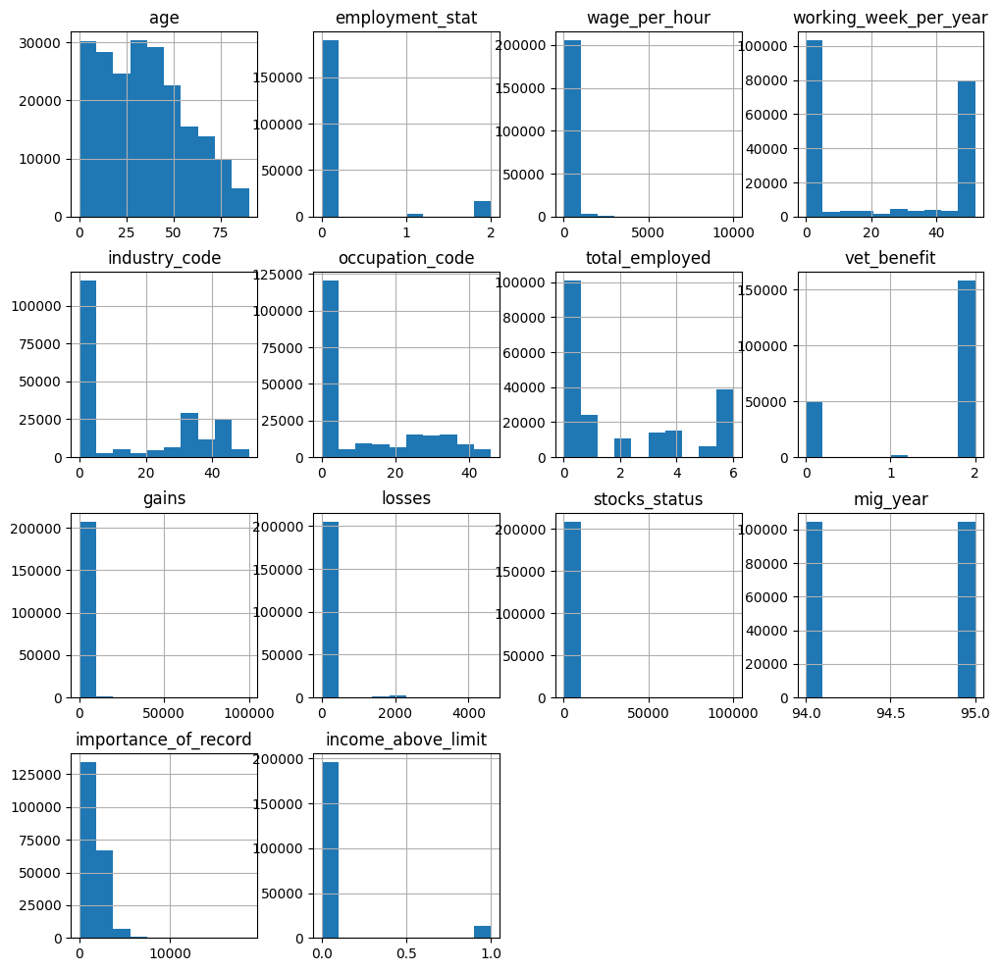

In [ ]:
train_data.hist(figsize=(12,12), sharex=False);

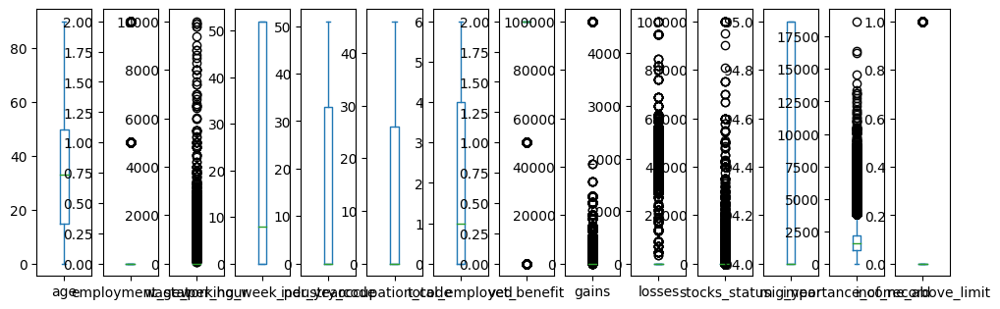

In [ ]:
train_data.plot(kind = 'box', figsize=(12,12),layout=(3,14), sharex=False, subplots=True);

<ipython-input-137-583cba27638e>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



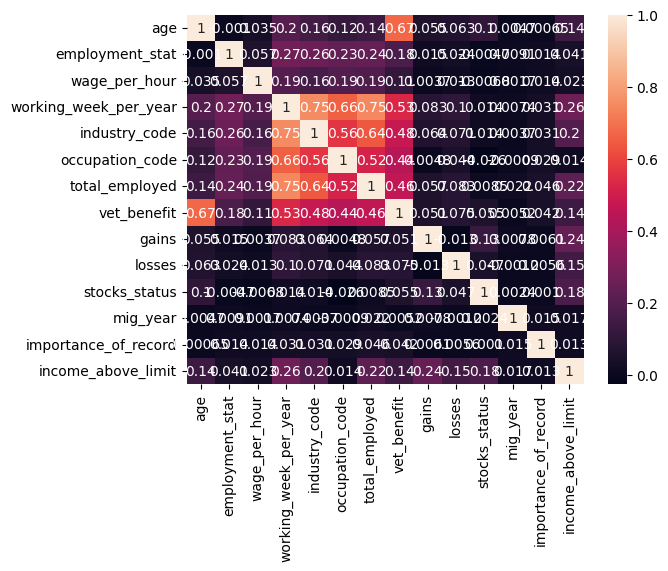

In [ ]:
sns.heatmap(train_data.corr(), annot=True);

In [ ]:

# Calculate the percentage of each education level
education_percentages = train_data['education'].value_counts(normalize=True) * 100

# Create a pie chart using Plotly Express
fig = px.pie(
    values=education_percentages.values,
    names=education_percentages.index,
    title='Percentage of Education Levels'
)
fig.show();

In [ ]:

# Create a scatter plot using Plotly Express
fig = px.scatter(train_data, x='working_week_per_year', y='gains', color='gender',
                 title="Scatter Plot of Gains vs. Working Week per Year by Gender",
                 labels={'working_week_per_year': 'Working Week per Year', 'gains': 'Gains'},
                 hover_data=['gender'])

# Show the plot
fig.show();

In [ ]:
train_data['occupation_code_main'].value_counts()

 Adm support including clerical           15351
 Professional specialty                   14544
 Executive admin and managerial           13107
 Other service                            12856
 Sales                                    12487
 Precision production craft & repair      11207
 Machine operators assmblrs & inspctrs     6650
 Handlers equip cleaners etc               4340
 Transportation and material moving        4244
 Farming forestry and fishing              3273
 Technicians and related support           3136
 Protective services                       1700
 Private household services                 878
 Armed Forces                                32
Name: occupation_code_main, dtype: int64

In [ ]:
import plotly.express as px

# Create a bar chart for occupation_code_main
fig = px.bar(train_data, x='occupation_code_main', title='Occupation Code Distribution')
fig.update_xaxes(title_text='Occupation Code')
fig.update_yaxes(title_text='Count')

# Count the occurrences of each occupation code
occupation_counts = train_data['occupation_code_main'].value_counts().reset_index()
occupation_counts.columns = ['occupation_code_main', 'count']

# Update the data for the chart
fig.data[0].x = occupation_counts['occupation_code_main']
fig.data[0].y = occupation_counts['count']

fig.show()



In [ ]:

# Create a grouped bar chart for occupation_code_main and income_above_limit
fig = px.histogram(train_data, x='occupation_code_main', color='income_above_limit',
             title='Occupation Code Distribution by Income Level',
             labels={'income_above_limit': 'Income Above Limit'})

fig.update_xaxes(title_text='Occupation Code')
fig.update_yaxes(title_text='Count')

fig.show()


In [ ]:
train_data.education.value_counts()

left                88398
High School         50627
Associate Degree    39464
Undergrad           20979
Grad                 8713
Doctorate            1318
Name: education, dtype: int64

In [ ]:
import plotly.express as px

# Create a histogram for occupation_code_main, education, and income_above_limit
fig = px.histogram(train_data, x='occupation_code_main', color='education', facet_col='income_above_limit',
                   title='Occupation Code and Education Distribution by Income Level',
                   labels={'education': 'Education Level', 'income_above_limit': 'Income Above Limit'})

fig.update_xaxes(title_text='Occupation Code')
fig.update_yaxes(title_text='Count')

fig.show()


In [ ]:
########### Encoding the target column

target_column['income_above_limit'] = target_column['income_above_limit'].map({'Above limit':1,'Below limit':0})
target_column['income_above_limit'].value_counts()

<ipython-input-145-c2bf777acfd3>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0    196501
1     12998
Name: income_above_limit, dtype: int64

Gender and Income Level check

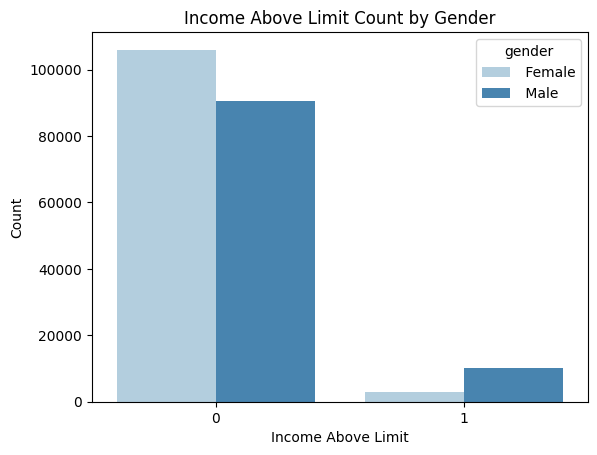

In [ ]:
#sns.countplot(train_data['income_above_limit'], palette='husl', hue='gender', data=train_data);
# Create a count plot for income_above_limit with hue based on gender
sns.countplot(data=train_data, x='income_above_limit', hue='gender', palette='Blues')

# Set plot labels and title
plt.xlabel('Income Above Limit')
plt.ylabel('Count')
plt.title('Income Above Limit Count by Gender')

# Show the plot
plt.show()


# Data Processing

* Missing Values(Dropping and Imputation Techniques) <br>
Here, we investigate the columns with missing values and make a decision on whether to drop those missing values or impute using appropriate strategies.


In [ ]:
def nan_value_pct(df):
    columns_with_high_missing = []
    for column in df.columns:
        pct = (df[column].isnull().sum())/(df.shape[0]* 100  # Calculate the percentage of missing values
        if pct >= 80:
            columns_with_high_missing.append(column)
    return columns_with_high_missing


In [ ]:
nan_value_pct(train_data)

[]

In [ ]:
print(colored('We see the distribution of NaN values in train data as below','green',attrs=['bold']))
nan_value_plot(train_data,  figsize =(12,12))

print('-------------------------------------------------------------------------------------------------')
print('\n')
print(colored('We see the distribution of NaN values in test data as below','blue',attrs=['bold']))
nan_value_plot(test_data)

We see the distribution of NaN values in train data as below


-------------------------------------------------------------------------------------------------


We see the distribution of NaN values in test data as below


<b>Class imbalance </b> <br>


We will be seeing the class imbalance using value_counts() method of pandas dataframe and use histogram to plot the imbalances
<hr>

Clearly we have a highly imbalanced dataset available with us and hence we need to perform steps to mitigate the imbalance accordingly. The following methods could be used:-
1. Downsample the majority class (Here majority class is 'Below limit')
2. Upsample the minority class (Here, minority class is 'Above limit')
3. Use class weights while performing model development <br>
Reference : https://scikit-learn.org/stable/modules/generated/sklearn.utils.class_weight.compute_class_weight.html



<b> NaN value analysis </b>


In [ ]:
def nan_value_plot(df):
    nan_dict  = {}
    for cols in df.columns:
        nan_dict[cols] = df[cols].isna().sum()/df.shape[0]
    nan_pct_df = pd.DataFrame.from_dict(nan_dict,orient='index').reset_index().rename({'index':'Columns',0:'NaN_pct'},axis=1)
    fig = px.bar(nan_pct_df,x='Columns',y='NaN_pct', height=400,width = 400,title='NaN value percentage in each column')
    fig.update_layout(
                        xaxis = dict(
                        tickfont = dict(size=5)))
    fig.show();

In [ ]:
print(colored('We see the distribution of NaN values in train data as below','green',attrs=['bold']))
nan_value_plot(train_data)

print('-------------------------------------------------------------------------------------------------')
print('\n')
print(colored('We see the distribution of NaN values in test data as below','blue',attrs=['bold']))
nan_value_plot(test_data)

We see the distribution of NaN values in train data as below


-------------------------------------------------------------------------------------------------


We see the distribution of NaN values in test data as below


<b> Comments:- </b>
* There are columns with extremely high proportion of NaN values, we may drop them.
* There are columns with NaN values that can be handled easily using imputations with mean, median (in case of numerical) or mode(in case of categorical)
* Use Models like LightGBM, CatBoost or XGBoost that handles the NaN values implicitly while model training.
* Observe that the proportion of NaN value distribution is same in train and test and select NaN value handling techniques accordingly.
* Be creative 🧠 (but also be logical 😉) !!



I will personally drop all the columns where the proportion of NaN values is above 80% and proceed with columns/features that are left.

In [ ]:
# nan_cols_drop  = []
# for cols in test_data.columns:
#     if test_data[cols].isna().sum()/test_data.shape[0] >0.8:
#         nan_cols_drop.append(cols)

In [ ]:
# print(colored(f'We will drop the following columns from both train and test data: ','yellow',attrs=['bold']))
# print(nan_cols_drop)

We will drop the following columns from both train and test data: 
['education_institute', 'unemployment_reason', 'is_labor_union', 'veterans_admin_questionnaire', 'old_residence_reg', 'old_residence_state']


In [ ]:
print('The shape of train and test data before dropping columns with high proportion of NaN values is - ')
print(colored(f'The shape of train data is    {train_data.shape}     ','green',attrs=['bold']))

print(colored(f'The shape of target column is {target_column.shape}','green',attrs=['bold']))

print(colored(f'The shape of test data is     {test_data.shape}      ','blue',attrs=['bold']))

train_data = train_data.drop(nan_cols_drop,axis=1)
test_data  = test_data.drop(nan_cols_drop,axis=1)

print('---------------------------------------------------------------------------------------------------')
print('The shape of train and test data after dropping columns with high proportion of NaN values is - ')
print(colored(f'The shape of train data is    {train_data.shape}     ','green',attrs=['bold']))

print(colored(f'The shape of target column is {target_column.shape}','green',attrs=['bold']))

print(colored(f'The shape of test data is     {test_data.shape}      ','blue',attrs=['bold']))

The shape of train and test data before dropping columns with high proportion of NaN values is - 
The shape of train data is    (209499, 43)     
The shape of target column is (209499, 1)
The shape of test data is     (89786, 42)      
---------------------------------------------------------------------------------------------------
The shape of train and test data after dropping columns with high proportion of NaN values is - 
The shape of train data is    (209499, 37)     
The shape of target column is (209499, 1)
The shape of test data is     (89786, 36)      


In [ ]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209499 entries, 0 to 209498
Data columns (total 37 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   ID                              209499 non-null  object 
 1   age                             209499 non-null  int64  
 2   gender                          209499 non-null  object 
 3   education                       209499 non-null  object 
 4   class                           104254 non-null  object 
 5   marital_status                  209499 non-null  object 
 6   race                            209499 non-null  object 
 7   is_hispanic                     209499 non-null  object 
 8   employment_commitment           209499 non-null  object 
 9   employment_stat                 209499 non-null  int64  
 10  wage_per_hour                   209499 non-null  int64  
 11  working_week_per_year           209499 non-null  int64  
 12  industry_code   

### Simple Baseline Validation strategy

We will now do an 80-20 split of train data provided. As discussed previously, the participants are free to use the validation strategy of their own choice.

Points to consider while selecting a validation strategy:
* Make sure the model is not overfitting on train data.
* CV score and leaderboard scores are in sync.
* Stable validation strategy when using K Folds etc.

In [ ]:
X_train, X_eval, y_train, y_eval = train_test_split(train_data, target_column, test_size=0.2, random_state=42,stratify=target_column)

### Model development 🤖 💻 🤖

We will be straight away using a CatBoost model for training because it handles categorical features well, can implicitly handle NaN values, and can give a quick baseline (with minimal preprocessing) which can be used as a benchmark to be improved upon.

<br>

In the below steps, we will convert all the categorical columns to string datatype and capture the indices where string datatype is present which will then be used as an input for the CatBoost Classification model.

In [ ]:
cat_cols_index = np.where(train_data.dtypes=='object')[0]
for i in range(len(train_data.columns)):
    if i in cat_cols_index:
        X_train[train_data.columns[i]]   = X_train[train_data.columns[i]].astype(str)
        X_eval[train_data.columns[i]]  = X_eval[train_data.columns[i]].astype(str)
        test_data[train_data.columns[i]] = test_data[train_data.columns[i]].astype(str)

In [ ]:
model           = CatBoostClassifier(random_state=42,n_estimators =50,auto_class_weights ='Balanced')
_               = model.fit(X_train,y_train,cat_features= cat_cols_index)


Learning rate set to 0.5
0:	learn: 0.0086760	total: 326ms	remaining: 16s
1:	learn: 0.0007748	total: 638ms	remaining: 15.3s
2:	learn: 0.0002754	total: 905ms	remaining: 14.2s
3:	learn: 0.0002754	total: 1.1s	remaining: 12.7s
4:	learn: 0.0002754	total: 1.32s	remaining: 11.9s
5:	learn: 0.0002754	total: 1.5s	remaining: 11s
6:	learn: 0.0002754	total: 1.72s	remaining: 10.6s
7:	learn: 0.0002754	total: 1.96s	remaining: 10.3s
8:	learn: 0.0002754	total: 2.19s	remaining: 9.96s
9:	learn: 0.0002754	total: 2.34s	remaining: 9.36s
10:	learn: 0.0002754	total: 2.5s	remaining: 8.87s
11:	learn: 0.0002753	total: 2.68s	remaining: 8.5s
12:	learn: 0.0002753	total: 2.9s	remaining: 8.24s
13:	learn: 0.0002753	total: 3.11s	remaining: 8.01s
14:	learn: 0.0002753	total: 3.34s	remaining: 7.8s
15:	learn: 0.0002753	total: 3.47s	remaining: 7.37s
16:	learn: 0.0002753	total: 3.62s	remaining: 7.03s
17:	learn: 0.0002753	total: 3.78s	remaining: 6.72s
18:	learn: 0.0002753	total: 3.98s	remaining: 6.5s
19:	learn: 0.0002753	total:

Parameter tuning tips for CatBoost:

👓 Do focus on parameters like n_estimators, max_depth, reg_lambda, reg_alpha, scale_pos_weight, learning_rate and explore other parameters from the link : https://catboost.ai/en/docs/references/training-parameters/


In [ ]:
acc_valid = accuracy_score(model.predict(X_eval),y_eval)

print(colored(f'The accuracy attained on the validation set is {acc_valid}','green',attrs=['bold']))



The accuracy attained on the validation set is 1.0


We got a good enough accuracy but is our model really performing that good ?? 🤔

👓 Consider the class imbalance of the data given with respect to the metric assigned. We can get 94% accuracy just by classifying everything as 'Below limit' but that will mean that we must get an accuracy above 94% to ensure the models are learning properly. 👓

🔭 Let's investigate the classification report for both train and validation data and see how good the baseline is.

In [ ]:
print('\n')
print('The classification report only on the validation data is below-')
print(colored(classification_report(y_test, model.predict(X_test)),'blue',attrs=['bold']))

print('The classification report only on the train data is below-')
print(colored(classification_report(train_y, model.predict(train)),'green',attrs=['bold']))



The classification report only on the validation data is below-
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     39300
           1       1.00      1.00      1.00      2600

    accuracy                           1.00     41900
   macro avg       1.00      1.00      1.00     41900
weighted avg       1.00      1.00      1.00     41900

The classification report only on the train data is below-
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    157201
           1       1.00      1.00      1.00     10398

    accuracy                           1.00    167599
   macro avg       1.00      1.00      1.00    167599
weighted avg       1.00      1.00      1.00    167599



The performance of our minority class in terms of precision and recall is too low. Hence our F1 score is also very low.



### A little hack

Let's do a small hack though 🤓 🤓 🤓

We can use probability based thresholds and see how performance improves. We will select a lower threshold for class label 1.
The default threshold is 0.5 which means that if the probability of 1 is above 0.5, then the predicted class is 1 else it is 0.

<br>

We will lower the threshold to 0.4 and say that if the probability of class being 1 is above 0.4, then we can classify it as 1 and if it is less than 0.4, then it will be 0.

In [ ]:
thresh     = 0.4
train_pred = np.where(model.predict_proba(train)[:,1]>thresh,1,0)
test_pred  = np.where(model.predict_proba(X_test)[:,1]>thresh,1,0)

print('\n')
print('The classification report only on the validation data is below-')
print(colored(classification_report(y_test,test_pred),'blue',attrs=['bold']))

print('The classification report only on the train data is below-')
print(colored(classification_report(train_y, train_pred),'green',attrs=['bold']))



The classification report only on the validation data is below-
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     39300
           1       1.00      1.00      1.00      2600

    accuracy                           1.00     41900
   macro avg       1.00      1.00      1.00     41900
weighted avg       1.00      1.00      1.00     41900

The classification report only on the train data is below-
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    157201
           1       1.00      1.00      1.00     10398

    accuracy                           1.00    167599
   macro avg       1.00      1.00      1.00    167599
weighted avg       1.00      1.00      1.00    167599



We do see some improvement in the performance because the f1 score on our validation data moved from 0.58 to 0.61.
For more information about how the threshold is selected, please follow [ROC Curve](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html) of sklearn and in general how ROC curve works 📚 📚

### Submission Time 🎉

We will now predict on the test data given and see what score we get on leaderboard.

We will now download the file "Sample_submission_1.csv" and submit it.

In [ ]:
# subdf                       = pd.read_csv('/content/SampleSubmission.csv')
# subdf['income_above_limit'] = model.predict(test_data)
# subdf.to_csv('Sample_submission_1.csv',index=False)
# subdf['income_above_limit'].value_counts(normalize=True)

In [ ]:
# #ss                      = pd.read_csv('/content/SampleSubmission.csv')
# ss ['income_above_limit'] = model.predict(test_data)
# ss .to_csv('Sample_submission_1.csv',index=False)
# ss ['income_above_limit'].value_counts(normalize=True)

How to get better scores:
1. Feature engineering is the key. Refer to the variable dictionary and create meaningful features which can boost the score
2. Try out different models and categorical data preprocessing (read about categorical encoding) because a lot of features are categorical.
3. Feature selection with feature importance
4. Keep a check on classification report to observe overfitting and underfitting and select appropriate hyper-parameters to tune.
5. Suitable probability threshold selection as shown above.
6. Be creative while selecting validation split
For example:- Use Stratified K folds, grouped K folds, repeated stratified k folds, train test split with stratification etc
7. Ensemble multiple models to get a stable prediction.
8. Be creative and may the best model win 🏆 🏆 🏆